# Stellar ejection velocity comparison

Notebook to accompany *Wagg et al. 2025* research note on stellar ejection velocities in population synthesis.

In [1]:
import matplotlib.pyplot as plt
import numpy as np
import astropy.units as u
from astropy.constants import G
import seaborn as sns
import pandas as pd
import h5py as h5
from scipy.stats import maxwell
import cogsworth

from seaborn_util import cmap_from_colour
import matplotlib as mpl
from matplotlib.colors import ListedColormap

In [2]:
%config InlineBackend.figure_format = 'retina'

plt.rc('font', family='serif')
plt.rcParams['text.usetex'] = False
fs = 24

# update various fontsizes to match
params = {'figure.figsize': (12, 8),
          'legend.fontsize': 0.7 * fs,
          'axes.labelsize': fs,
          'xtick.labelsize': 0.7 * fs,
          'ytick.labelsize': 0.7 * fs,
          'axes.linewidth': 1.1,
          'xtick.major.size': 7,
          'xtick.minor.size': 4,
          'ytick.major.size': 7,
          'ytick.minor.size': 4,
          'legend.fontsize': fs,
}
plt.rcParams.update(params)

# show all pandas columns
pd.set_option('display.max_columns', None)

<hr>

# Read data

## `COSMIC`

In [3]:
bpp, cosmic_kicks = pd.read_hdf("data/cosmic/cosmic.h5", key="bpp"), pd.read_hdf("data/cosmic/cosmic.h5", key="kick_info")
cosmic_kicks.drop_duplicates(subset="bin_num", keep="first", inplace=True)

sn_1_row = bpp[bpp["evol_type"] == 15].iloc[0]

v_orb = (2 * np.pi * sn_1_row["sep"] * u.Rsun / sn_1_row["porb"] / u.day).to(u.km / u.s)
cosmic_v_orb_2 = sn_1_row["mass_1"] / (sn_1_row["mass_1"] + sn_1_row["mass_2"]) * v_orb
vsys_2_total = cosmic_kicks[cosmic_kicks["star"] == 1]["vsys_2_total"]

final_bpp = bpp.drop_duplicates(subset="bin_num", keep="last")

cosmic_m1_prev, cosmic_m2_prev = sn_1_row[["mass_1", "mass_2"]].values
cosmic_m1_post = final_bpp[final_bpp["sep"] == -1].iloc[0]["mass_1"]

In [4]:
bpp, cosmic_kicks_kiel = pd.read_hdf("data/cosmic/cosmic_kiel.h5", key="bpp"), pd.read_hdf("data/cosmic/cosmic_kiel.h5", key="kick_info")
cosmic_kicks_kiel.drop_duplicates(subset="bin_num", keep="first", inplace=True)

sn_1_row = bpp[bpp["evol_type"] == 15].iloc[0]

v_orb = (2 * np.pi * sn_1_row["sep"] * u.Rsun / sn_1_row["porb"] / u.day).to(u.km / u.s)
cosmic_kiel_v_orb_2 = sn_1_row["mass_1"] / (sn_1_row["mass_1"] + sn_1_row["mass_2"]) * v_orb
vsys_2_total = cosmic_kicks_kiel[cosmic_kicks_kiel["star"] == 1]["vsys_2_total"]

final_bpp = bpp.drop_duplicates(subset="bin_num", keep="last")

cosmic_kiel_m1_prev, cosmic_kiel_m2_prev = sn_1_row[["mass_1", "mass_2"]].values
cosmic_kiel_m1_post = final_bpp[final_bpp["sep"] == -1].iloc[0]["mass_1"]

## `COMPAS`

In [5]:
df_dict = {}

with h5.File(f"data/compas/COMPAS_Output.h5") as f:
    for k in f["BSE_Supernovae"].keys():
        df_dict[k] = f["BSE_Supernovae"][k][...]
df = pd.DataFrame(df_dict).set_index("SEED", drop=False)
df = df.drop_duplicates(subset="SEED", keep="first")

print(f'Disruption rate: {100 - ((df["Unbound"] == 0).sum() / len(df) * 100)}%')

compas_v_orb_2 = (df["Orb_Velocity<SN"] * (df["Mass_Total@CO(SN)"] / (df["Mass(CP)"] + df["Mass_Total@CO(SN)"]))).iloc[0] * u.km / u.s
compas_m1_prev = df["Mass_Total@CO(SN)"].iloc[0]
compas_m2_prev = df["Mass(CP)"].iloc[0]
compas_m1_post = df["Mass(SN)"].iloc[0]

print(f"v_orb_2 = {compas_v_orb_2}")

compas_kicks = df.rename(columns={"ComponentSpeed(CP)": "vsys_2_total",
                                 "Applied_Kick_Magnitude(SN)": "natal_kick",
                                 "Unbound": "disrupted",
                                 "SN_Kick_Theta(SN)": "phi",
                                 "SN_Kick_Phi(SN)": "theta"})
compas_kicks["theta"] = compas_kicks["theta"].apply(lambda x: np.degrees(x))
compas_kicks["phi"] = compas_kicks["phi"].apply(lambda x: np.degrees(x))

Disruption rate: 99.104%
v_orb_2 = 14.632644587924512 km / s


## `binary_c`

In [6]:
bc_kicks = pd.read_csv("data/binary_c/first.dat", header=0, sep="\s+")

bc_kicks.rename(columns={"v_other_tt": "vsys_2_total", "sn_kick_speed": "natal_kick",
                         "sn_kick_omega": "theta", "sn_kick_phi": "phi"}, inplace=True)
bc_kicks["theta"] = bc_kicks["theta"].apply(lambda x: np.degrees(x))
bc_kicks["phi"] = bc_kicks["phi"].apply(lambda x: np.degrees(x))

bc_kicks["disrupted"] = ((bc_kicks["separation"] < 0.0) | (bc_kicks["vsys_2_total"] == 0.0)).astype(int)

bc_m1_prev = bc_kicks["pre_sn_mass_1"].iloc[0]
bc_m2_prev = bc_kicks["pre_sn_mass_2"].iloc[0]
bc_m1_post = bc_kicks["mass"].iloc[0]

bc_v_orb = (2 * np.pi * bc_kicks["pre_sn_separation"].values * u.Rsun / bc_kicks["pre_sn_period"].values / u.yr).to(u.km / u.s)
bc_v_orb_2 = ((bc_kicks["pre_sn_mass_1"] / (bc_kicks["pre_sn_mass_1"] + bc_kicks["pre_sn_mass_2"])).iloc[0] * bc_v_orb[0])

## All together now!

In [7]:
data = [
    {"kicks": cosmic_kicks, "v_orb_2": cosmic_v_orb_2, "l": "COSMIC", "c": "rebeccapurple",
     "m1_prev": cosmic_m1_prev, "m2_prev": cosmic_m2_prev, "m1_post": cosmic_m1_post},
    {"kicks": compas_kicks, "v_orb_2": compas_v_orb_2, "l": "COMPAS", "c": "steelblue",
     "m1_prev": compas_m1_prev, "m2_prev": compas_m2_prev, "m1_post": compas_m1_post},
    {"kicks": bc_kicks, "v_orb_2": bc_v_orb_2, "l": "binary_c", "c": "teal",
     "m1_prev": bc_m1_prev, "m2_prev": bc_m2_prev, "m1_post": bc_m1_post},
    {"kicks": cosmic_kicks_kiel, "v_orb_2": cosmic_kiel_v_orb_2, "l": "COSMIC (KH09)", "c": "grey",
     "m1_prev": cosmic_kiel_m1_prev, "m2_prev": cosmic_kiel_m2_prev, "m1_post": cosmic_kiel_m1_post},
]

<hr>

# Detailed evolution

## COSMIC

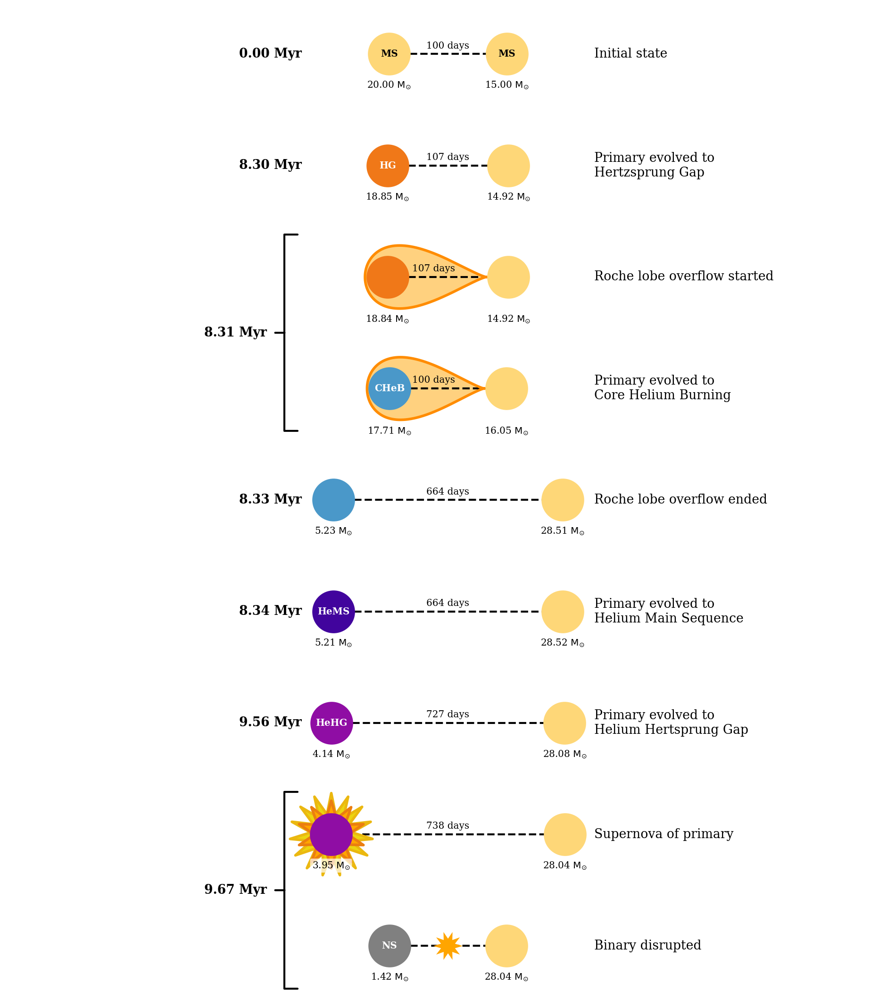

(<Figure size 1200x1350 with 1 Axes>, <Axes: >)

In [8]:
cogsworth.plot.plot_cartoon_evolution(bpp.loc[0].iloc[:9], 0)

## COMPAS

<KeysViewHDF5 ['Age(1)', 'Age(2)', 'Ang_Momentum(1)', 'Ang_Momentum(2)', 'Ang_Momentum_Total', 'Beta', 'Dominant_Mass_Loss_Rate(1)', 'Dominant_Mass_Loss_Rate(2)', 'Eccentricity', 'Energy_Total', 'Luminosity(1)', 'Luminosity(2)', 'MT_History', 'Mass(1)', 'Mass(2)', 'Mass@ZAMS(1)', 'Mass@ZAMS(2)', 'MassTransferRateDonor', 'Mass_0(1)', 'Mass_0(2)', 'Mass_CO_Core(1)', 'Mass_CO_Core(2)', 'Mass_Core(1)', 'Mass_Core(2)', 'Mass_Env(1)', 'Mass_Env(2)', 'Mass_He_Core(1)', 'Mass_He_Core(2)', 'Mdot(1)', 'Mdot(2)', 'Metallicity@ZAMS(1)', 'Metallicity@ZAMS(2)', 'Omega(1)', 'Omega(2)', 'Omega_Break(1)', 'Omega_Break(2)', 'Pulsar_Birth_Period(1)', 'Pulsar_Birth_Period(2)', 'Pulsar_Birth_Spin_Down(1)', 'Pulsar_Birth_Spin_Down(2)', 'Pulsar_Mag_Field(1)', 'Pulsar_Mag_Field(2)', 'Pulsar_Spin_Down(1)', 'Pulsar_Spin_Down(2)', 'Pulsar_Spin_Freq(1)', 'Pulsar_Spin_Freq(2)', 'Radius(1)', 'Radius(2)', 'Record_Type', 'RocheLobe(1)', 'RocheLobe(2)', 'SEED', 'SemiMajorAxis', 'Stellar_Type(1)', 'Stellar_Type(2)', 'S

/home/tom/miniconda3/envs/cogsworth/lib/python3.11/site-packages/astropy/units/quantity.py:671: RuntimeWarning: invalid value encountered in sqrt
  result = super().__array_ufunc__(function, method, *arrays, **kwargs)


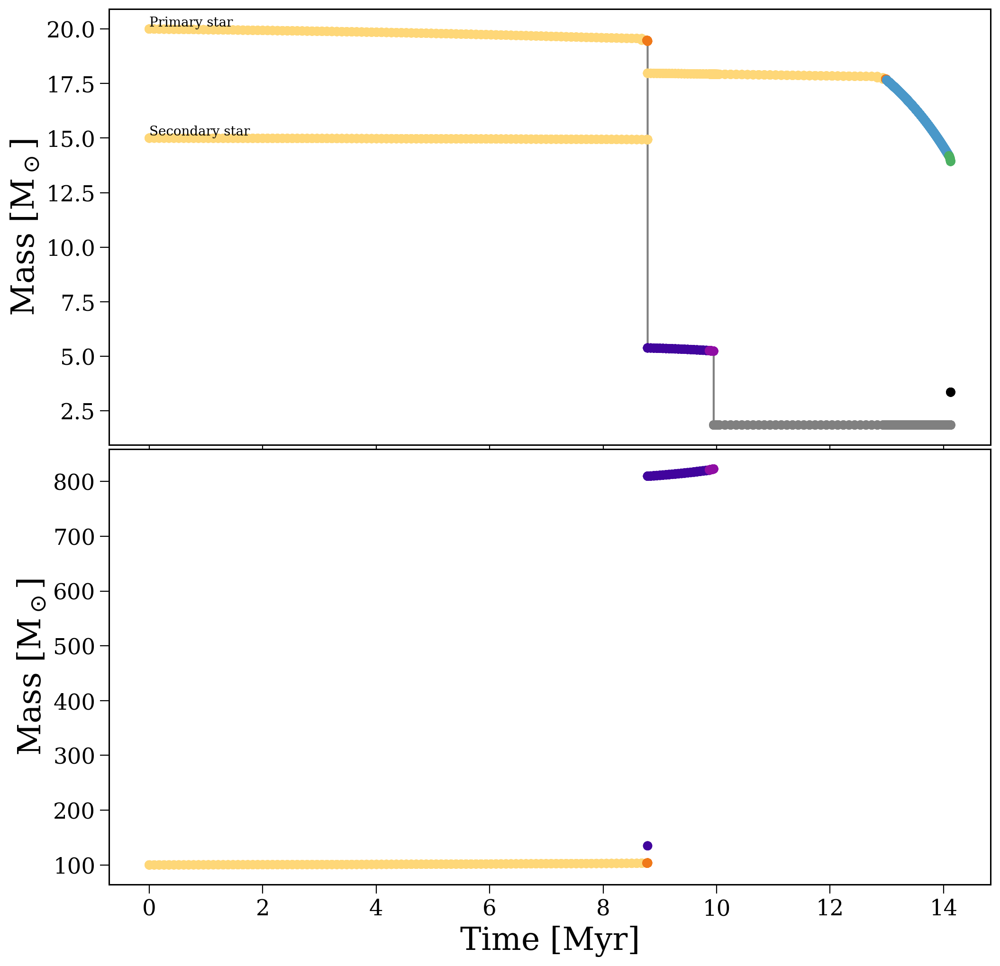

In [9]:
fig, axes = plt.subplots(2, 1, figsize=(12, 12), sharex=True)

fig.subplots_adjust(hspace=0.01)

ax = axes[0]
with h5.File(f"data/compas/BSE_Detailed_Output_0.h5", "r") as f:
    ax.plot(f["Time"][...], f["Mass(1)"][...], color="grey", zorder=-1)
    ax.scatter(f["Time"][...], f["Mass(1)"][...], c=[cogsworth.utils.kstar_translator[k]["colour"] for k in f["Stellar_Type(1)"][...]])
    ax.scatter(f["Time"][...], f["Mass(2)"][...], c=[cogsworth.utils.kstar_translator[k]["colour"] for k in f["Stellar_Type(2)"][...]])

    ax.annotate("Primary star", xy=(0, 20), va="bottom")
    ax.annotate("Secondary star", xy=(0, 15), va="bottom")
    print(f.keys())

    ax.set(ylabel="Mass [M$_\odot$]")

ax = axes[1]
with h5.File(f"data/compas/BSE_Detailed_Output_0.h5", "r") as f:
    # ax.plot(f["Time"][...], f["Mass(1)"][...], color="grey", zorder=-1)

    orbital_period = 2 * np.pi * np.sqrt((f["SemiMajorAxis"][...] * u.Rsun)**3 / (G * (f["Mass(1)"][...] + f["Mass(2)"][...]) * u.Msun)).to(u.day)
    print(orbital_period)

    # ax.scatter(f["Time"][...][f["Stellar_Type(1)"][...] < 13], f["SemiMajorAxis"][...][f["Stellar_Type(1)"][...] < 13])
    ax.scatter(f["Time"][...][f["Stellar_Type(1)"][...] < 13], orbital_period[f["Stellar_Type(1)"][...] < 13],
               c=[cogsworth.utils.kstar_translator[k]["colour"] for k in f["Stellar_Type(1)"][...][f["Stellar_Type(1)"][...] < 13]], label="Primary star")

    # ax.annotate("Primary star", xy=(0, 20), va="bottom")
    # ax.annotate("Secondary star", xy=(0, 15), va="bottom")
    print(f.keys())

    ax.set(xlabel="Time [Myr]", ylabel="Mass [M$_\odot$]")

# Basic histograms

First, we can separately plot the natal kick distributions (to ensure they are identical) and consider how the ejection velocity distributions compare.

## Natal kick

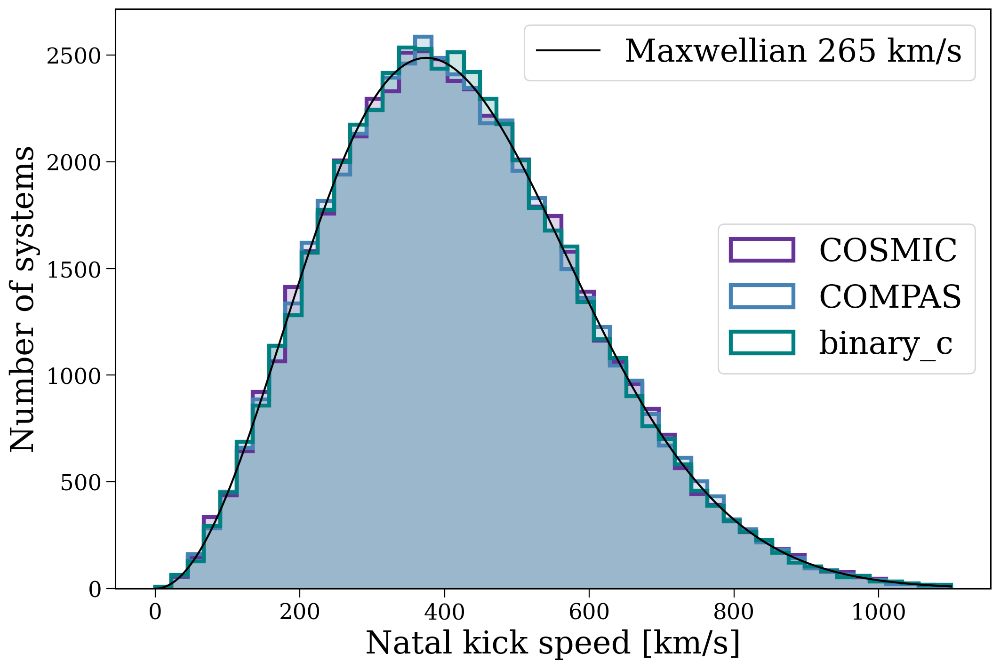

In [13]:
fig, ax = plt.subplots()

bins = np.linspace(0, 1100, 50)
v_range = np.linspace(0, 1100, 1000)

for d in data[:-1]:
    ax.hist(d["kicks"]["natal_kick"], bins=np.linspace(0, 1100, 50), histtype="step",
            lw=3, color=d["c"], label=d['l']);
    ax.hist(d["kicks"]["natal_kick"], bins=np.linspace(0, 1100, 50), color=d['c'], alpha=0.2);

leg = ax.legend(loc="center right")

ax.plot(v_range, len(d["kicks"]) * maxwell.pdf(v_range, scale=265) * bins[1], color="black", label="Maxwellian 265 km/s")
# ax.plot(v_range, len(d["kicks"]) * maxwell.pdf(v_range, scale=215) * bins[1], color="black", linestyle="--", label="Maxwellian 215 km/s")

handles, labels = ax.get_legend_handles_labels()
ax.legend(handles[-1:], labels[-1:], loc="upper right")
ax.add_artist(leg)

ax.set(xlabel="Natal kick speed [km/s]", ylabel="Number of systems")

plt.show()

## Ejection velocity

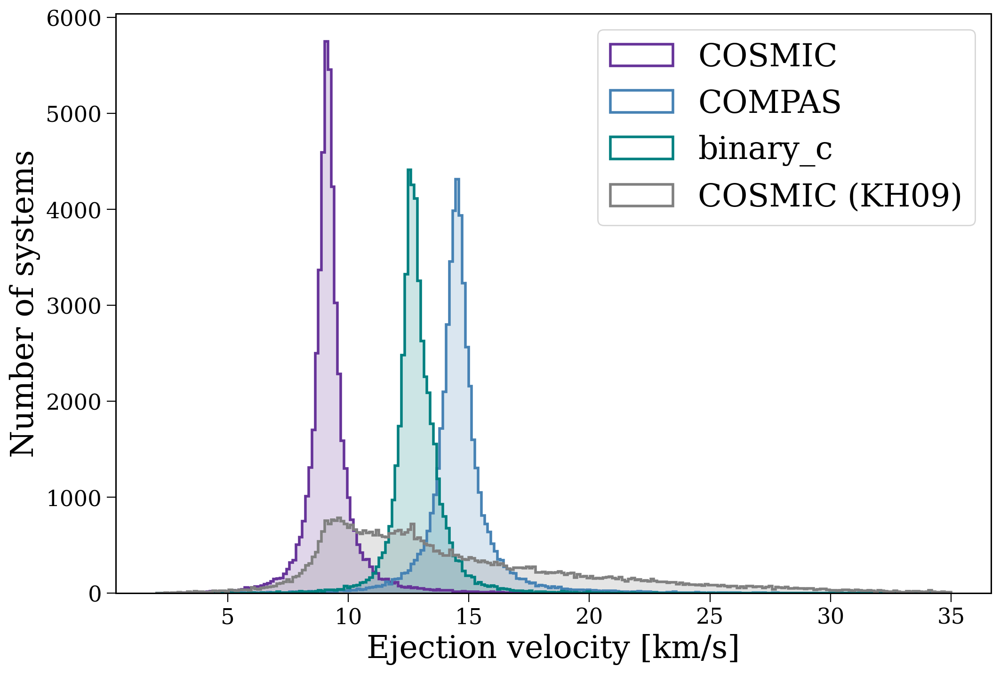

In [14]:
fig, ax = plt.subplots()

bins = np.linspace(2, 35, 250)
for d in data:
    kicks = d["kicks"][d["kicks"]["disrupted"] == 1]
    ax.hist(kicks["vsys_2_total"], bins=bins, histtype="step",
            lw=2, color=d["c"], label=d['l']);
    ax.hist(kicks["vsys_2_total"], bins=bins, color=d['c'], alpha=0.2);

ax.legend(ncol=1)

ax.set(xlabel="Ejection velocity [km/s]",
       ylabel="Number of systems")

plt.show()

[-3.2135503 -0.0877752  4.5707266]
[-4.38369371 -0.09697807  6.38085737]
[-12.9023882  -0.1474882   3.7844428]


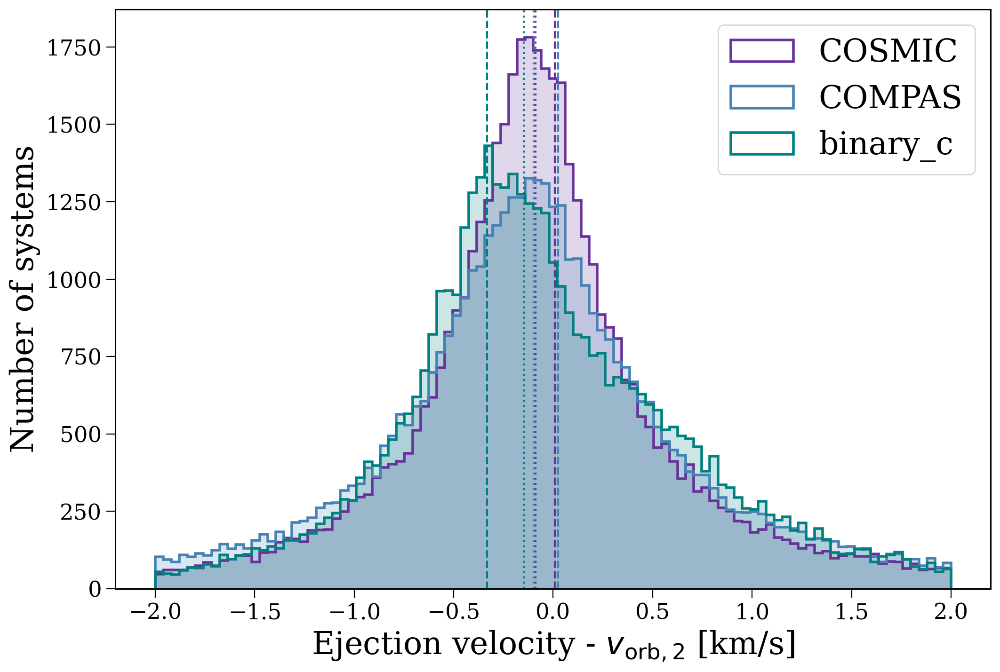

In [15]:
fig, ax = plt.subplots()

bins = np.linspace(-2, 2, 100)
for d in data[:-1]:
    kicks = d["kicks"][d["kicks"]["disrupted"] == 1]
    diff = kicks["vsys_2_total"] - d["v_orb_2"]
    ax.hist(diff, bins=bins, histtype="step",
            lw=2, color=d["c"], label=d['l']);
    ax.hist(diff, bins=bins, color=d['c'], alpha=0.2);
    ax.axvline(np.mean(diff), color=d["c"], linestyle="--")
    ax.axvline(np.median(diff), color=d["c"], linestyle="dotted")

    print(np.percentile(diff, [1, 50, 99]))

ax.legend(ncol=1)

ax.set(xlabel="Ejection velocity - $v_{\\rm orb,2}$ [km/s]",
       ylabel="Number of systems")

plt.show()

[-3.2135503 -0.0877752  4.5707266]
[-4.38369371 -0.09697807  6.38085737]
[-12.9023882  -0.1474882   3.7844428]


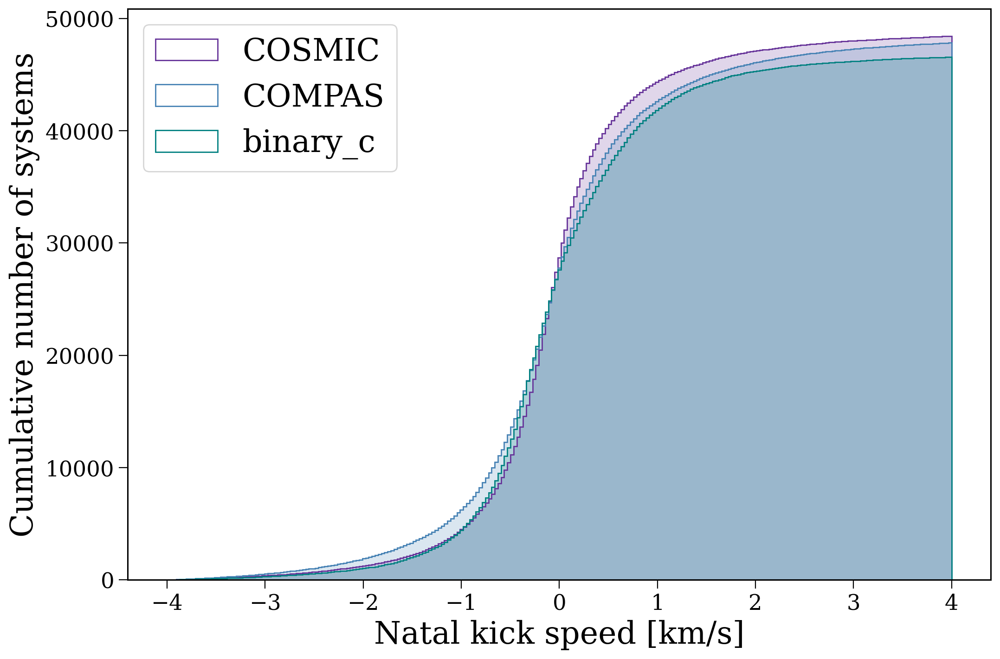

In [16]:
fig, ax = plt.subplots()

bins = np.linspace(-4, 4, 250)
for d in data[:-1]:
    kicks = d["kicks"][d["kicks"]["disrupted"] == 1]
    diff = kicks["vsys_2_total"] - d["v_orb_2"]
    ax.hist(diff, bins=bins, histtype="step",
            lw=1, color=d["c"], label=d['l'], cumulative=True);
    ax.hist(diff, bins=bins, color=d['c'], alpha=0.2, cumulative=True);

    print(np.percentile(diff, [1, 50, 99]))

ax.legend(ncol=1)

ax.set(xlabel="Natal kick speed [km/s]", ylabel="Cumulative number of systems")

plt.show()

# 2D density distributions

In [22]:
def plot_kick_density(d, label="COSMIC", every=1, lim=4.5, CORNER_ANNOTATE=False, save=None,
                      gridsize=500, **kwargs):
    """Plot 2D density distribution for each different population synthesis code"""

    levels = [0.05, 0.25, 0.5, 0.75, 0.9, 1.0]
    level_labels = ["95%", "75%", "50%", "25%", "10%", "0%"]

    natal_kicks, v_orb_2 = d["kicks"], d["v_orb_2"]

    fig, axes = plt.subplots(2, 2, figsize=(12, 12), gridspec_kw={"width_ratios": [4, 1], "height_ratios": [1, 4]}, sharex="col", sharey="row")
    fig.subplots_adjust(hspace=0.03, wspace=0.03)

    # difference between ejection velocities and preSN orbital velocity
    mask = (natal_kicks["disrupted"] == 1) & (natal_kicks["vsys_2_total"] > 0.0)
    diff = natal_kicks["vsys_2_total"][mask] - v_orb_2

    # add difference histogram within chosen limits (and remove white lines with patches)
    patches = axes[0, 0].hist(diff[abs(diff) < lim], bins=np.linspace(-lim, lim, 150), **kwargs)[-1]
    for patch in patches:
        patch.set_edgecolor(patch.get_facecolor())

    # same for the natal kick magnitude
    patches = axes[1, 1].hist(natal_kicks["natal_kick"],
                              bins=np.linspace(0, 1100, 50),
                              orientation="horizontal", **kwargs)[-1]
    for patch in patches:
        patch.set_edgecolor(patch.get_facecolor())

    axes[1, 0].scatter(np.mean(diff),
                       np.mean(natal_kicks["natal_kick"][mask]),
                       marker="x", s=100, color="white", zorder=10)
    # same for median
    axes[1, 0].scatter(np.median(diff),
                       np.median(natal_kicks["natal_kick"][mask]),
                       marker="+", s=200, color="white", zorder=10)

    sns.kdeplot(x=diff[::every],
                y=natal_kicks["natal_kick"][mask][::every],
                ax=axes[1, 0], fill=True, levels=levels,
                gridsize=gridsize,
                **kwargs)

    axes[1, 0].set(xlabel=r"$v_{\rm 2, postSN} - v_{\rm 2, preSN}$ (km/s)",
                   ylabel="Natal kick velocity (km/s)",
                   xlim=(-lim, lim),
                   ylim=(0, 1100))
    
    axes[0, 0].set(ylabel=r"$N_{\rm systems}$")
    axes[1, 1].set(xlabel=r"$N_{\rm systems}$")

    # annotate system details in corner or on main panel
    if CORNER_ANNOTATE:
        axes[0, 1].annotate(label, (0.5, 0.8), xycoords="axes fraction", color="black", fontsize=fs, ha="center", va="center")
        axes[0, 1].annotate(
            r"$v_{\rm 2, preSN} = $" + f'{v_orb_2.value:1.1f} km/s\n' +
            r"$f_{\rm disrupt} = $" + f'{natal_kicks["disrupted"].sum() / len(natal_kicks):1.3f}\n' +
            r"$m_{\rm 1, preSN} = $" + f'{sn_1_row["mass_1"]:1.2f} $\\rm M_{{\odot}}$\n' +
            r"$m_{\rm 1, postSN} = $" + f'{bpp.iloc[-1]["mass_1"]:1.2f} $\\rm M_{{\odot}}$\n' +
            r"$m_{\rm 2} = $" + f'{sn_1_row["mass_2"]:1.2f} $\\rm M_{{\odot}}$',
            (0.5, 0.35), xycoords="axes fraction", fontsize=0.6*fs, ha="center", va="center"
        )
    else:
        axes[1, 0].annotate(label, (0.05, 0.95), xycoords="axes fraction", color="black",
                            fontsize=1.3*fs, fontweight="normal", ha="left", va="top")
        axes[1, 0].annotate(
            " " * 2 + r"$v_{\rm 2, preSN} = $" + f'{v_orb_2.value:1.1f} km/s\n' +
            " " * 4 + r"$f_{\rm disrupt} = $" + f'{natal_kicks["disrupted"].sum() / len(natal_kicks) * 100:1.0f}%\n' +
            " " * 1 + r"$m_{\rm 1, preSN} = $" + f'{d["m1_prev"]:1.2f} $\\rm M_{{\odot}}$\n' +
            r"$m_{\rm 1, postSN} = $" + f'{d["m1_post"]:1.2f} $\\rm M_{{\odot}}$\n' +
            " " * 9 + r"$m_{\rm 2} = $" + f'{d["m2_prev"]:1.2f} $\\rm M_{{\odot}}$',
            (0.64, 0.98), xycoords="axes fraction", fontsize=0.7*fs, ha="left", va="top"
        )

    # add a line at zero and hide the mini ax
    axes[1, 0].axvline(0, color="black", linestyle="dotted", lw=1)
    axes[0, 1].axis("off")

    # the lazy man's guide to colorbars: just plot hidden points
    cmap = cmap_from_colour(d["c"])
    scatter = axes[1, 0].scatter(np.ones_like(levels) * 1e5, np.ones_like(levels) * 1e-21, c=levels, cmap=cmap)
    inset_all_ax = axes[1, 0].inset_axes([0.03, 0.5, 0.08, 0.35])
    cbar = fig.colorbar(scatter, ax=axes[1, 0], cax=inset_all_ax, boundaries=levels)
    # cbar.ax.invert_yaxis()
    cbar.set_ticklabels(level_labels)
    cbar.ax.tick_params(labelsize=fs)

    if save is not None:
        plt.savefig(f"paper/figures/{save}.pdf", format="pdf", bbox_inches="tight")
    
    plt.show()

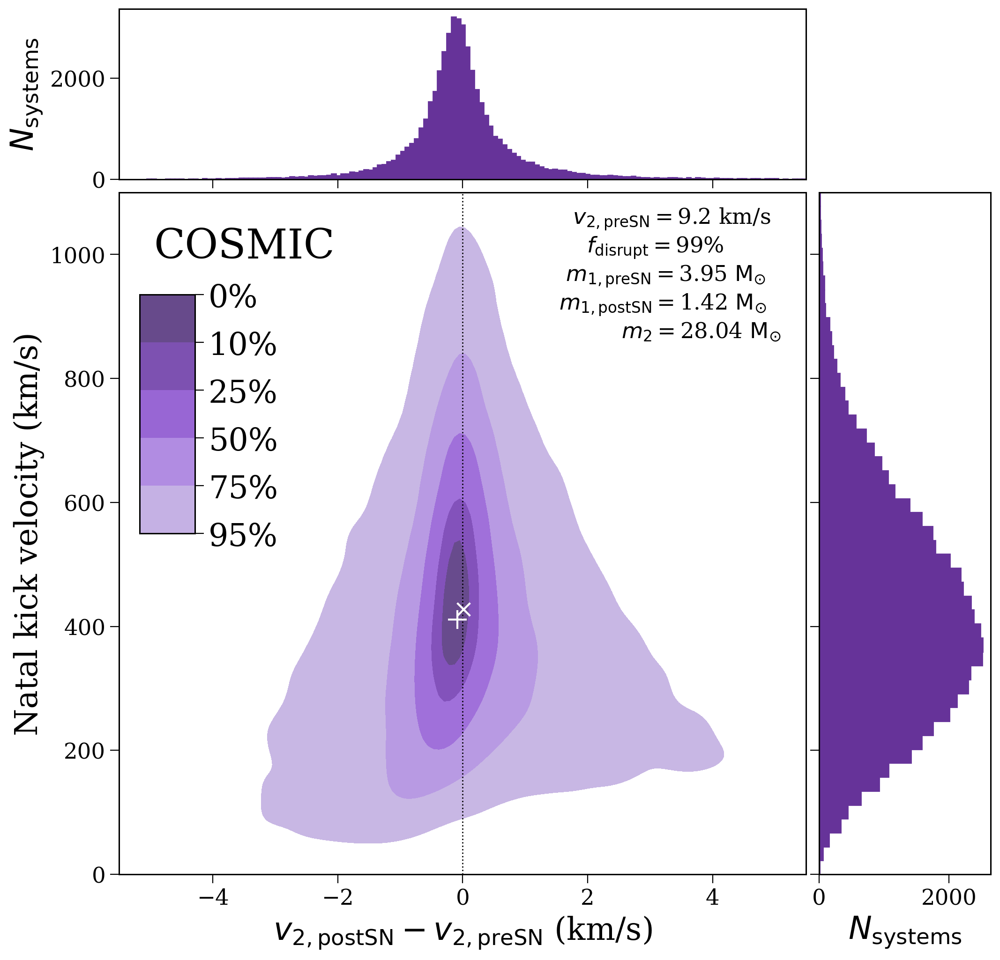

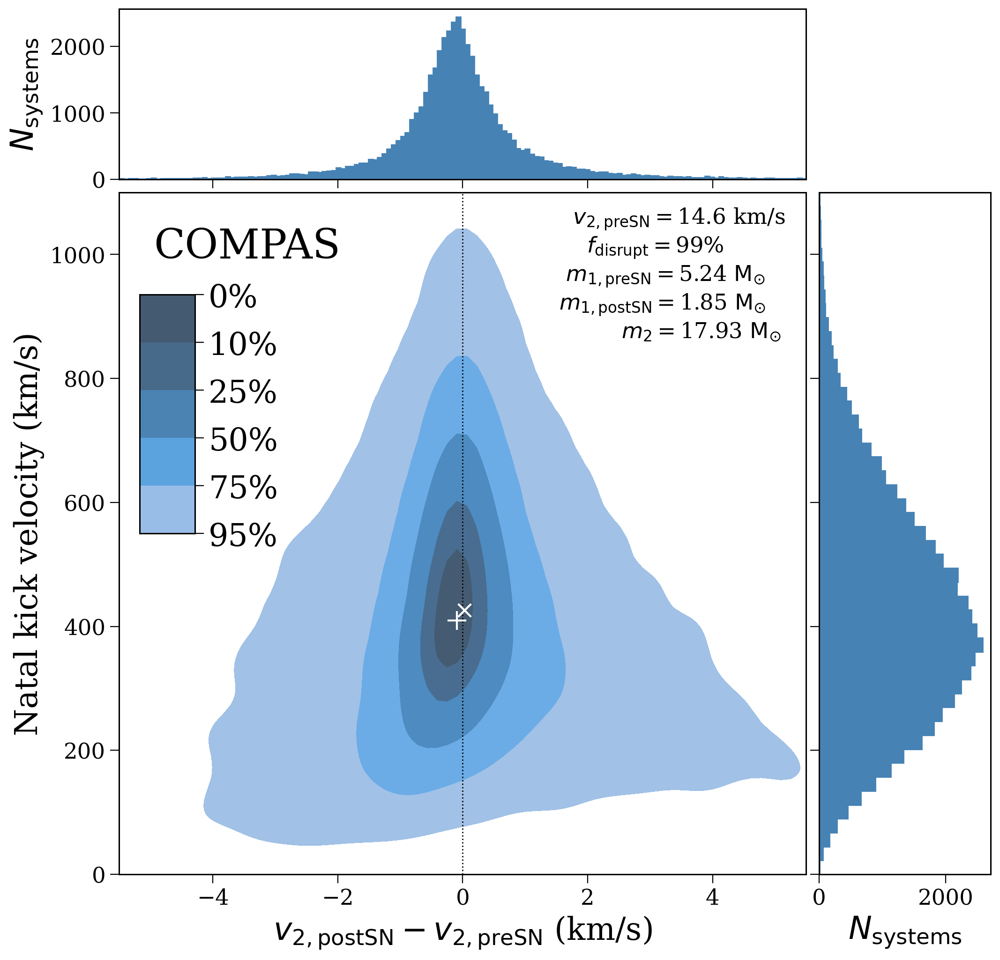

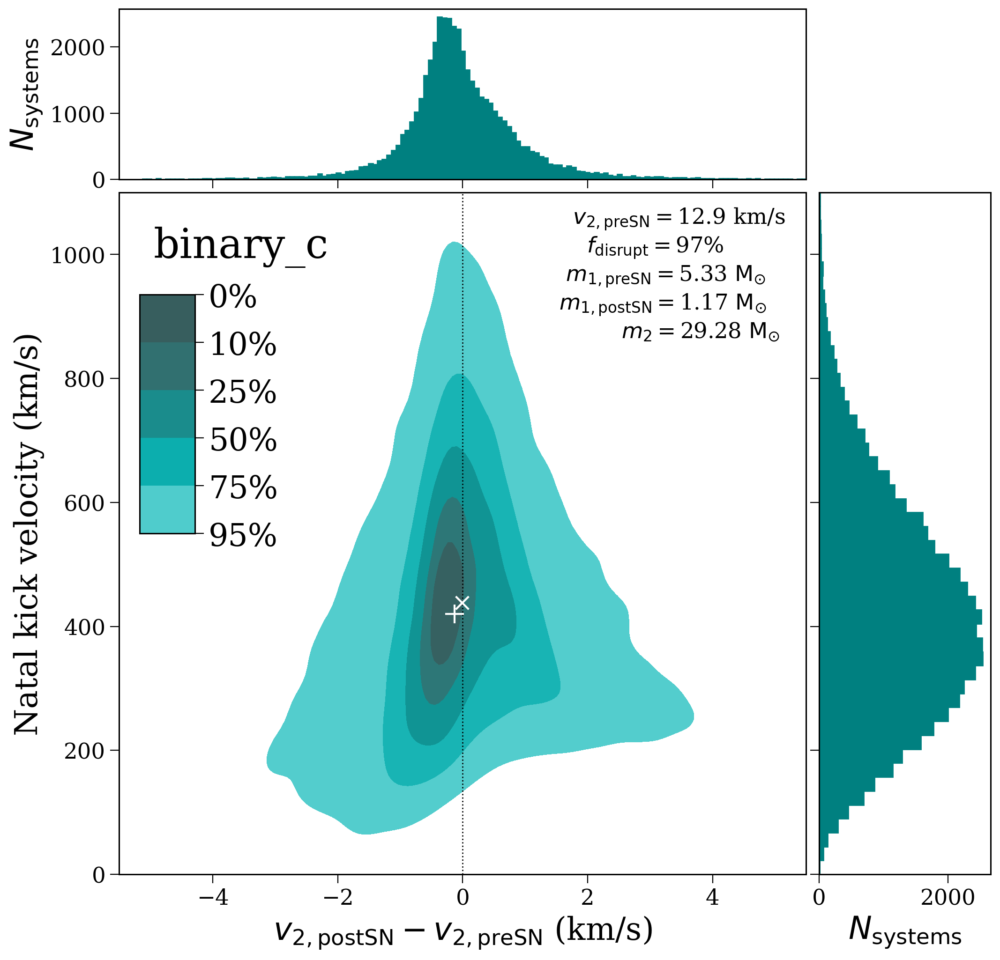

In [24]:
for d in data[:-1]:
    plot_kick_density(d, label=d["l"], save=d["l"].lower(),
                      color=d["c"], lim=5.5,
                    #   every=10, gridsize=200)
                      every=1, gridsize=500)

## Angular dependence

### Azimuthal angle

In [287]:
def plot_coordinates(ax, cmap=None):
    ax.scatter([0], [0], color="black", s=100)
    ax.scatter([1], [0], color="black", s=100)

    r = np.linspace(0, 1, 1000)
    theta = np.linspace(0, 2 * np.pi, 2000)
    R, Theta = np.meshgrid(r, theta)
    c_vals = Theta / (2 * np.pi)
    c_vals += 0.25
    c_vals[c_vals < 0] += 1
    c_vals[c_vals > 1] -= 1

    if cmap is None:
        cmap = "twilight"

    ax.pcolormesh(R * np.cos(Theta), R * np.sin(Theta), c_vals,
                  cmap=cmap, shading='auto', zorder=-10, rasterized=True)

    # ax.arrow(0, 0, 0, -0.5, head_width=0.05, head_length=0.05, fc='black', ec='black', lw=3)
    ax.arrow(1, 0, 0, 0.75, head_width=0.05, head_length=0.05, fc='black', ec='black', lw=3)

    offset = 1.25
    for xy, label in zip([(1, 0), (0, 1), (-1, 0), (0, -1)], [r"$\frac{\pi}{2}$", r"$\pi$", r"$\frac{3\pi}{2}$", r"$\omega = 0$"]):
        ax.annotate(label, xy, xytext=(xy[0] * offset, xy[1] * offset),
                    fontsize=fs if xy[1] != -1 else fs * 0.8, ha="center", va="center")
        
    offset = 0.25
    ax.annotate("P", (0, 0), xytext=(0 - offset, 0), fontsize=0.8*fs, ha="center", va="center", fontweight="bold")
    ax.annotate("C", (1, 0), xytext=(1 - offset, 0), fontsize=0.8*fs, ha="center", va="center", fontweight="bold")

    ax.set(xlim=(-1.5, 1.5),
           ylim=(-1.5, 1.5),
           xticks=[],
           yticks=[])
    ax.set_aspect("equal")
    ax.set_frame_on(False)
    return ax

In [119]:
num_segments = 13
centred_values = np.linspace(0, 1, num_segments)
centred_values = np.sort(np.concatenate([centred_values[0:1], centred_values[1:-1], centred_values[1:-1], centred_values[-1:]]))
centred_values[-1] = 1.0
custom_cmap = ListedColormap(plt.cm.twilight(centred_values))


/tmp/ipykernel_115626/2218684675.py:16: UserWarning: The input coordinates to pcolormesh are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolormesh.
  ax.pcolormesh(R * np.cos(Theta), R * np.sin(Theta), c_vals,


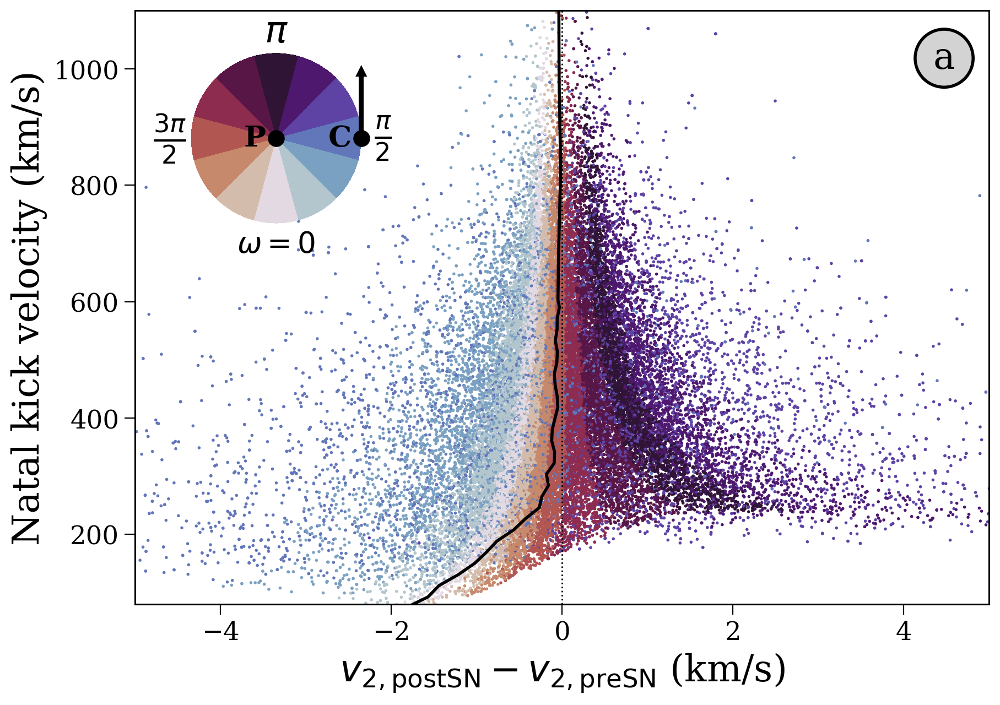

In [322]:
def plot_ejection_kick_with_angle(d, save=None):

    fig, ax = plt.subplots(figsize=(10, 7))

    natal_kicks = d["kicks"]
    mask = (natal_kicks["disrupted"] == 1) & (natal_kicks["vsys_2_total"] > 0.0)

    x = natal_kicks["vsys_2_total"][mask] - d["v_orb_2"]
    y = natal_kicks["natal_kick"][mask]
    c = natal_kicks["theta"][mask] / 360 * 2 * np.pi

    random_order = np.random.permutation(len(x))
    x, y, c = x.values[random_order], y.values[random_order], c.values[random_order]

    cmap = custom_cmap
    scatter = ax.scatter(x, y, c=c, s=1, cmap=cmap,
                         rasterized=True, vmin=0, vmax=2 * np.pi)

    kick_range = np.concatenate((np.linspace(45, 600, 30),
                                 np.linspace(605, 1200, 5)))
    medians = [np.median(x[(y > kick_range[i]) & (y < kick_range[i + 1])])
               for i in range(len(kick_range) - 1)]

    ax.plot(medians, (kick_range[:-1] + kick_range[1:]) / 2, color="black", lw=2)
    ax.axvline(0, color="black", linestyle="dotted", lw=1)

    # cbar = plt.colorbar(scatter)
    # cbar.set_label(r"Azimuthal angle of kick, $\omega \, [\rm rad]$")
    # cbar.ax.set_yticks([0, np.pi / 2, np.pi, 3 * np.pi / 2, 2 * np.pi])
    # cbar.ax.set_yticklabels(["0", r"$\pi/2$", r"$\pi$", r"$3\pi/2$", r"$2\pi$"])
    # cbar.solids.set_edgecolor("face")

    ax.set(xlabel=r"$v_{\rm 2, postSN} - v_{\rm 2, preSN}$ (km/s)",
           ylabel="Natal kick velocity (km/s)",
           xlim=(-5, 5),
           ylim=(0, 1100))
    
    # ax.annotate("System remains bound", xy=(0.8, 0.04), xycoords="axes fraction", color="grey",
    #             fontsize=0.7*fs, fontweight="normal", ha="center", va="center")
    
    # add an ellipse
    # ax.add_artist(Ellipse((3.7, 50), 10, 250, angle=-.3, fill=True, color="gainsboro",  zorder=-5))

    ax.annotate("a", xy=(0.96, 0.95), ha="right", va="top", fontsize=fs,
                bbox=dict(boxstyle="circle", fc="lightgrey", ec="black", lw=2), xycoords="axes fraction")

    # add the coordinate system
    inset_ax = ax.inset_axes([0.00, 0.57, 0.33, 0.43])
    plot_coordinates(inset_ax, cmap=cmap)

    ax.set_ylim(bottom=80)

    if save is not None:
        plt.savefig(f"paper/figures/{save}.pdf", format="pdf", bbox_inches="tight", dpi=300)

    plt.show()
    
for d in [data[2]]:
    plot_ejection_kick_with_angle(d, save=d["l"].lower() + "_angles")

### Polar angle

In [299]:
def truncate_colormap(cmap, minval=0.0, maxval=0.95, n=256):
    """Rescale a colormap to use only a portion of its range."""
    new_cmap = mpl.colors.LinearSegmentedColormap.from_list(
        f'trunc({cmap.name},{minval:.2f},{maxval:.2f})',
        cmap(np.linspace(minval, maxval, n))
    )
    return new_cmap

def plot_polar_coordinates(ax, cmap=None):
    ax.scatter([0], [0], color="black", s=100)
    ax.scatter([1], [0], color="black", s=100)

    r = np.linspace(0, 1, 1000)
    phi = np.linspace(0, np.pi / 2, 2000)
    R, Phi = np.meshgrid(r, phi)
    

    c_vals = Phi / (np.pi / 2)

    if cmap is None:
        cmap = truncate_colormap(plt.get_cmap("cividis_r"), 0.1, 1.0).resampled(8)

    ax.pcolormesh(R * np.cos(Phi), R * np.sin(Phi), c_vals,
                  cmap=cmap, shading='auto', zorder=-10, rasterized=True)

    ax.annotate("", xytext=(1.05, 0.2), xy=(0.2, 1.05),
                arrowprops={"arrowstyle": "-|>, head_width=0.5, head_length=0.5",
                            "color": "black", "lw": 3, "connectionstyle": "arc3,rad=0.33"})
    ax.annotate(r"$|\varphi|$", xy=(0.8, 0.8), fontsize=fs)

    offset = 1.15
    for xy, label in zip([(1, 0), (-0.1, 0.8)], [r"$0$", r"$\frac{\pi}{2}$"]):
        ax.annotate(label, xy, xytext=(xy[0] * offset, xy[1] * offset),
                    fontsize=fs, ha="center", va="center")
        
    offset = 0.2
    ax.annotate("P", (0, 0), xytext=(0, 0 - offset), fontsize=0.8*fs, ha="center", va="center", fontweight="bold")
    ax.annotate("C", (1, 0), xytext=(1, 0 - offset), fontsize=0.8*fs, ha="center", va="center", fontweight="bold")

    ax.set(xlim=(-0.1, 1.2),
           ylim=(-0.1, 1.2),
           xticks=[],
           yticks=[])
    ax.set_aspect("equal")
    ax.set_frame_on(False)
    return ax

/tmp/ipykernel_115626/1447781461.py:18: UserWarning: The input coordinates to pcolormesh are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolormesh.
  ax.pcolormesh(R * np.cos(Phi), R * np.sin(Phi), c_vals,


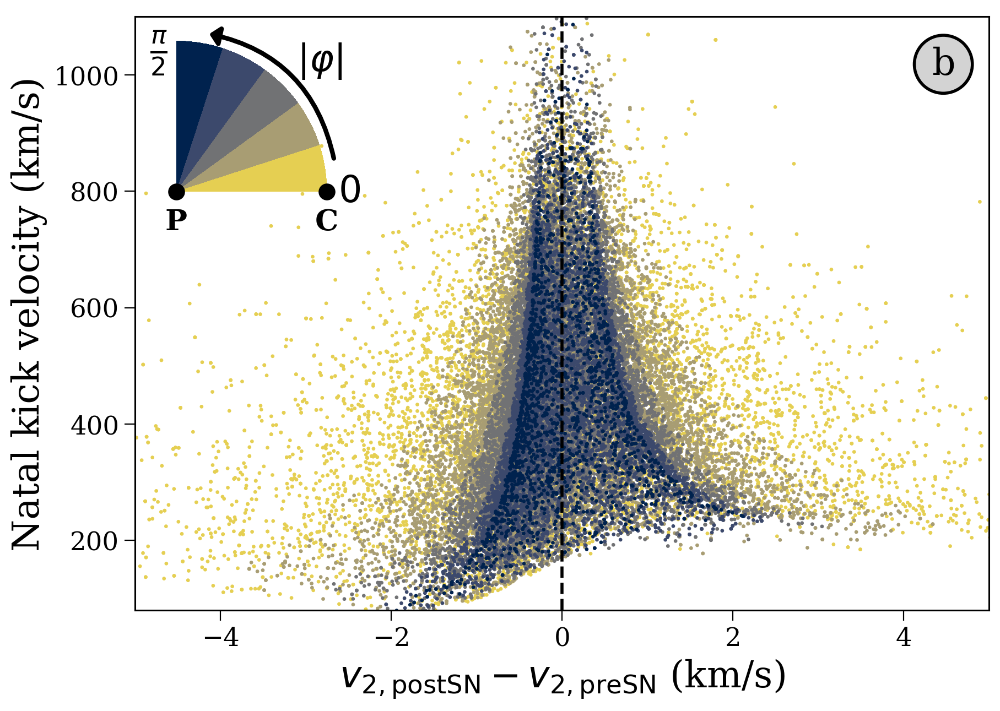

In [ ]:
def plot_ejection_kick_with_polar_angle(d, save=None):

    fig, ax = plt.subplots(figsize=(10, 7))

    natal_kicks = d["kicks"]
    mask = (natal_kicks["disrupted"] == 1) & (natal_kicks["vsys_2_total"] > 0.0)

    x = natal_kicks["vsys_2_total"][mask] - d["v_orb_2"]
    y = natal_kicks["natal_kick"][mask]
    c = np.abs(natal_kicks["phi"][mask] / 360 * 2 * np.pi)

    random_order = np.random.permutation(len(x))
    random_order = np.argsort(c)
    x, y, c = x.values[random_order], y.values[random_order], c.values[random_order]
    
    cmap = truncate_colormap(plt.get_cmap("cividis_r"), 0.1, 1.0).resampled(5)
    scatter = ax.scatter(x, y, c=c, s=2, cmap=cmap,
                        rasterized=True, vmin=0, vmax=np.pi / 2)

    ax.set(xlabel=r"$v_{\rm 2, postSN} - v_{\rm 2, preSN}$ (km/s)",
           ylabel="Natal kick velocity (km/s)",
           xlim=(-5, 5),
           ylim=(0, 1100))

    ax.axvline(0, color="black", linestyle="--", lw=2)

    # ax.annotate("In plane", xytext=(-4.6, 900), xy=(-3, 600), color=cmap(0.0), fontsize=0.8*fs,
    #             arrowprops=dict(arrowstyle="-|>", lw=2, color=cmap(0.0), connectionstyle="arc3,rad=0.2"))
    # ax.annotate("Out of plane", xytext=(4.5, 700), xy=(1, 400), color=cmap(1.0), fontsize=0.8*fs, ha="right",
    #             arrowprops=dict(arrowstyle="-|>", lw=2, color=cmap(1.0), connectionstyle="arc3,rad=-0.3"),
    #             bbox=dict(boxstyle="round,pad=0.0", fc="white", ec="none"))


    inset_ax = ax.inset_axes([0.02, 0.68, 0.25, 0.33])
    plot_polar_coordinates(inset_ax, cmap=cmap)

    ax.set_ylim(bottom=80)

    ax.annotate("b", xy=(0.96, 0.95), ha="right", va="top", fontsize=fs,
                bbox=dict(boxstyle="circle", fc="lightgrey", ec="black", lw=2), xycoords="axes fraction")

    if save is not None:
        plt.savefig(f"paper/figures/{save}.pdf", format="pdf", bbox_inches="tight", dpi=300)

    plt.show()
    
for d in [data[2]]:
    plot_ejection_kick_with_polar_angle(d, save="binary_c_polar_angle")

# Correction to Kiel & Hurley 2009

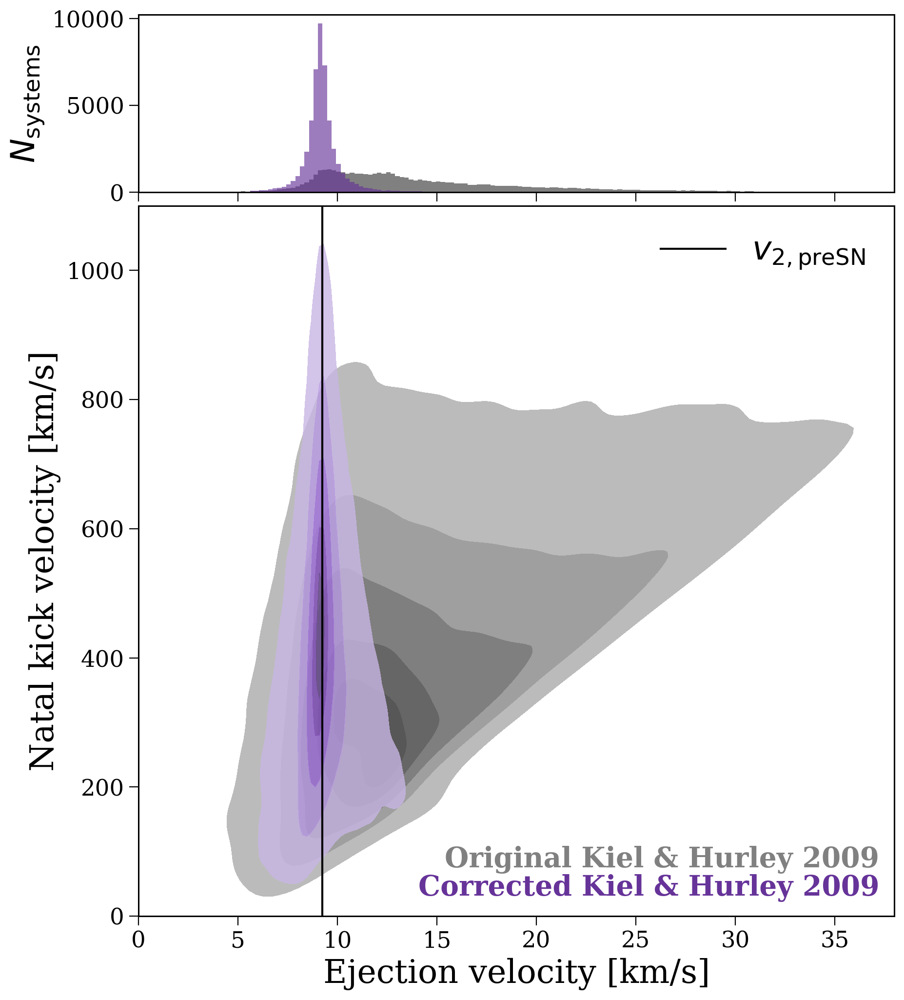

In [22]:
levels = [0.05, 0.25, 0.5, 0.75, 0.9, 1.0]
level_labels = ["95%", "75%", "50%", "25%", "10%", "0%"]

EVERY = 1
GRIDSIZE = 200

fig, axes = plt.subplots(2, 1, figsize=(10, 12), gridspec_kw={"height_ratios": [1, 4]},
                         sharex="col", sharey="row")
fig.subplots_adjust(hspace=0.03, wspace=0.03)

for d, alpha in zip([data[-1], data[0]], [1.0, 0.8]):
    natal_kicks, v_orb_2 = d["kicks"], d["v_orb_2"]

    # difference between ejection velocities and preSN orbital velocity
    mask = (natal_kicks["disrupted"] == 1) & (natal_kicks["vsys_2_total"] > 0.0)
    x = d["kicks"]["vsys_2_total"][mask]
    y = d["kicks"]["natal_kick"][mask]
    
    axes[0].hist(x, bins=np.linspace(4, 38, 150), color=d["c"],
                #  histtype="step" if alpha < 1.0 else "stepfilled",
                alpha=alpha**2, rasterized=True,
                 lw=2)

    sns.kdeplot(x=x[::EVERY],
                y=y[::EVERY],
                ax=axes[1], fill=True, alpha=alpha, levels=levels,
                gridsize=GRIDSIZE,
                color=d["c"])

axes[1].axvline(d["v_orb_2"].value, color="black", lw=1.5, label=r"$v_{\rm 2, preSN}$")
axes[1].legend(loc="upper right", frameon=False)

axes[1].set(xlabel=r"Ejection velocity [km/s]",
                ylabel="Natal kick velocity [km/s]",
                xlim=(0, 38),
                ylim=(0, 1100))

axes[0].set(ylabel=r"$N_{\rm systems}$")

# for label, y, c in zip(["Original KH09", "Corrected KH09"], [0.07, 0.02], [data[-1]["c"], data[0]["c"]]):
for label, y, c in zip(["Original Kiel & Hurley 2009", "Corrected Kiel & Hurley 2009"], [0.06, 0.02], [data[-1]["c"], data[0]["c"]]):
    axes[1].annotate(label,
                        xy=(0.98, y), xycoords="axes fraction",
                        ha="right", va="bottom", fontsize=0.85*fs, color=c, fontweight="bold")

plt.savefig("paper/figures/cosmic_kiel_comparison.pdf", format="pdf", bbox_inches="tight")

plt.show()

# Other investigations

## Strange `binary_c` binaries

In [89]:
weirdos = bc_kicks[((bc_kicks["vsys_2_total"] == 0) & (bc_kicks["disrupted"] == 1))]

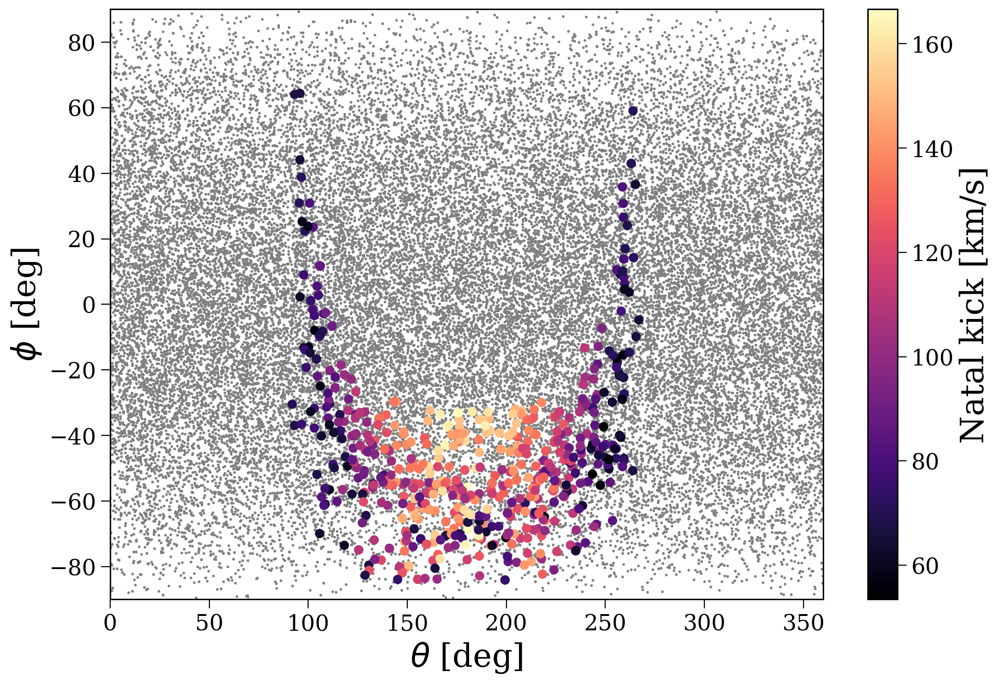

In [111]:
plt.scatter(bc_kicks["theta"], bc_kicks["phi"], c='grey', s=1)
scatter = plt.scatter(weirdos["theta"], weirdos["phi"], c=weirdos["natal_kick"], cmap="magma")
plt.colorbar(scatter, label="Natal kick [km/s]")
plt.xlim(0, 360)
plt.ylim(-90, 90)
plt.xlabel(r"$\theta$ [deg]")
plt.ylabel(r"$\phi$ [deg]")
plt.show()

## `binary_c` weirdos compared to bound systems

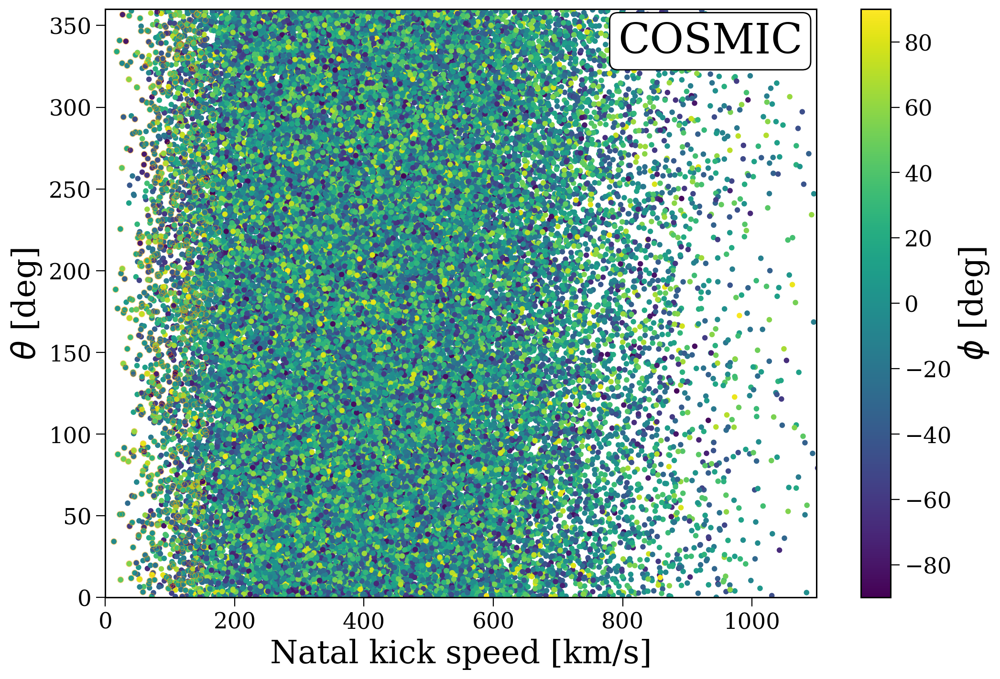

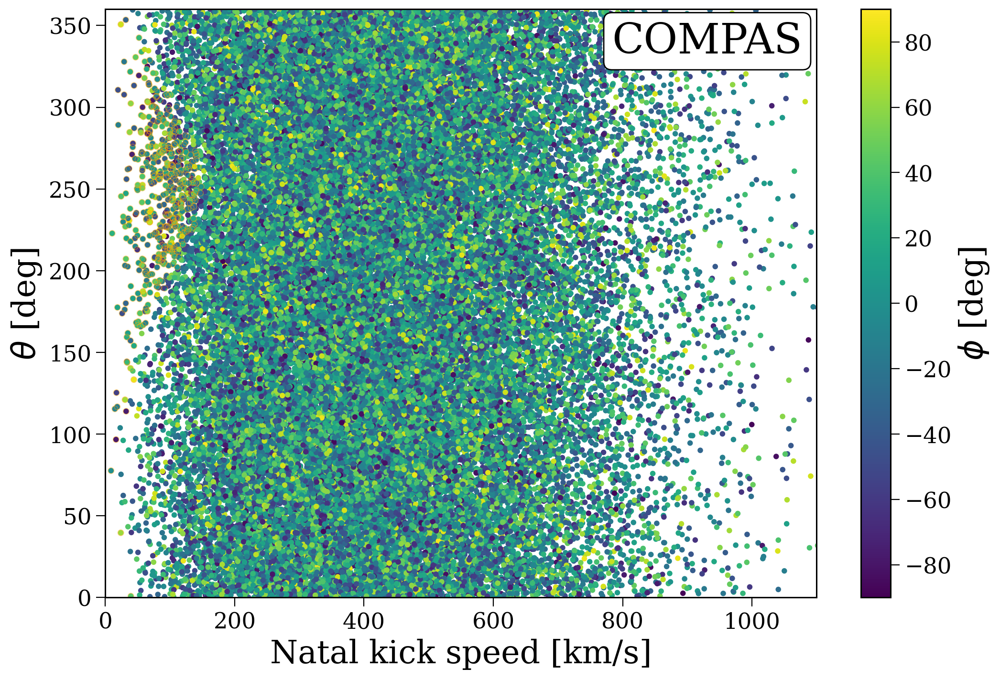

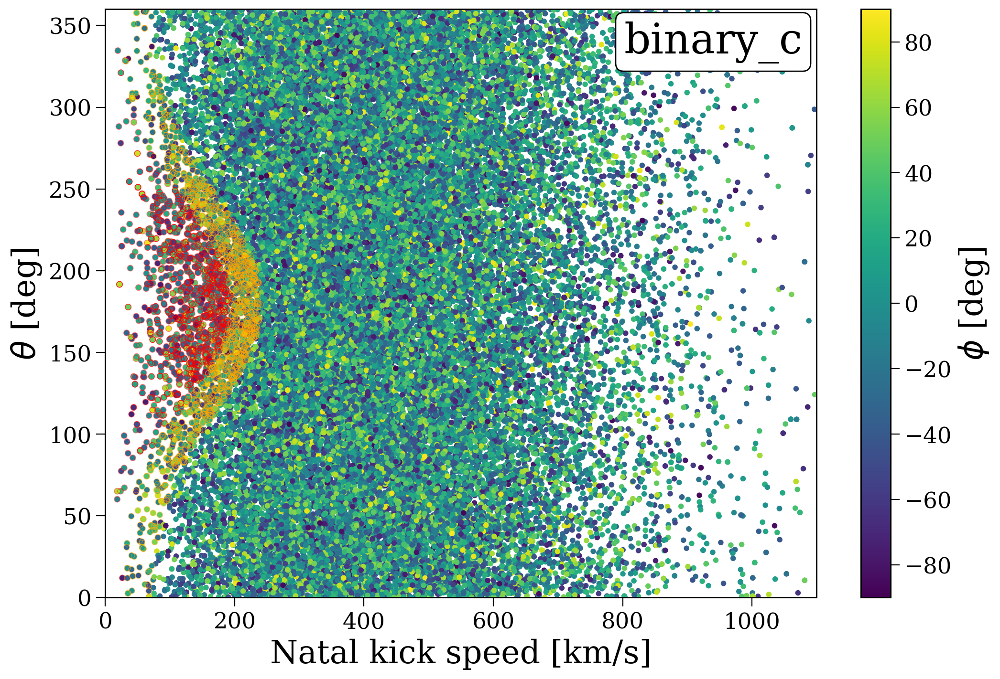

In [180]:
for d in data:
    scatter = plt.scatter(d["kicks"]["natal_kick"], d["kicks"]["theta"], s=10, c=d["kicks"]["phi"], vmin=-90, vmax=90, cmap="viridis")

    mask = (d["kicks"]["vsys_2_total"] == 0) & (d["kicks"]["disrupted"] == 1)
    plt.scatter(d["kicks"]["natal_kick"][mask], d["kicks"]["theta"][mask], s=20, marker="o",
                facecolor="none", edgecolor="red", lw=0.5, alpha=0.5)
    mask = (d["kicks"]["disrupted"] == 0)
    plt.scatter(d["kicks"]["natal_kick"][mask], d["kicks"]["theta"][mask], s=20, marker="o",
                facecolor="none", edgecolor="orange", lw=0.5, alpha=0.5)
    cbar = plt.colorbar(scatter, label=r"$\phi$ [deg]")
    plt.xlabel("Natal kick speed [km/s]")
    plt.ylabel(r"$\theta$ [deg]")
    plt.xlim(0, 1100)
    plt.ylim(0, 360)
    plt.annotate(d["l"], (0.98, 0.98), xycoords="axes fraction", color="black",
                 fontsize=1.3*fs, fontweight="normal", ha="right", va="top",
                 bbox=dict(facecolor="white", edgecolor="black", boxstyle="round,pad=0.2"))
    plt.show()